### Use Type Analysis 

The initial portion of our proejct was focused on the physical aspects of Inglewood. So this is mainly a short recap of what we found previously. Particularly, we wanted to see if there were any significant changes from 2010 to 2020. In this notebook, we intend to reproduce that data and potentially clean it up accordingly for our final presentation.

In [2]:
# for data wrangling
import pandas as pd

# for interactive plots
import plotly.express as px

# to import open data
from sodapy import Socrata

First I begin by importing the libraries I will be using to conduct the use type analysis.

In [3]:
client = Socrata("data.lacounty.gov", None)

results = client.get("9trm-uz8i",
                    limit=50000,
                    where="taxratearea_city='INGLEWOOD' AND rollyear=2006")

df = pd.DataFrame.from_records(results)

df.sample(2)

,situszip,taxratearea_city,ain,rollyear,taxratearea,assessorid,usetype,usecode,usecodedescchar1,usecodedescchar2,...,situsdirection,situsstreet,situsunit,situscity,rowid,center_lat,center_lon,location_1,propertylocation,situszip5
3607,90302-1445,INGLEWOOD,4013033027,2006,04569,4013-033-027,SFR,0100,Residential,Single Family Residence,...,N,PARK AVE,,INGLEWOOD CA,20064013033027,33.98029241,-118.34601895,"{'latitude': '33.98029241', 'longitude': '-118...",1328 N PARK AVE INGLEWOOD CA 90302,90302
17957,90303-2007,INGLEWOOD,4031004011,2006,04580,4031-004-011,C/I,2400,Commercial,"Non-Auto Service and Repair Shop, Paint Shop, ...",...,,CRENSHAW BLVD,,INGLEWOOD CA,20064031004011,33.93731916,-118.32688879,"{'latitude': '33.93731916', 'longitude': '-118...",10811 CRENSHAW BLVD INGLEWOOD CA 90303,90303


I have now imported the data using the LA county assessor's portal API and also produced some samples to ensure that the data was imported correctly.

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

df.sample(2)

,situszip,taxratearea_city,ain,rollyear,taxratearea,assessorid,usetype,usecode,usecodedescchar1,usecodedescchar2,usecodedescchar3,usecodedescchar4,totbuildingdatalines,yearbuilt,effectiveyearbuilt,sqftmain,bedrooms,bathrooms,units,recordingdate,roll_landvalue,roll_landbaseyear,roll_impvalue,roll_impbaseyear,roll_totlandimp,roll_homeownersexemp,roll_realestateexemp,roll_fixturevalue,roll_fixtureexemp,roll_perspropvalue,roll_perspropexemp,istaxableparcel,roll_totalvalue,roll_totalexemption,nettaxablevalue,parcelclassification,adminregion,cluster,parcelboundarydescription,situshouseno,situsfraction,situsdirection,situsstreet,situsunit,situscity,rowid,center_lat,center_lon,location_1,propertylocation,situszip5
16258,90303-2429,INGLEWOOD,4029008005,2006,04572,4029-008-005,SFR,0100,Residential,Single Family Residence,,,1,1954,1954,1277,3,2,1,19770727,37008,1978,63407,1978,100415,7000,0,0,0,0,0,Y,100415,7000,93415,,09,09134,TRACT # 19033 LOT 5,2324,,,HUDSPETH ST,,INGLEWOOD CA,20064029008005,33.93170976,-118.31977678,"{'latitude': '33.93170976', 'longitude': '-118...",2324 HUDSPETH ST INGLEWOOD CA 90303,90303
19367,90303-2110,INGLEWOOD,4033007004,2006,04564,4033-007-004,SFR,0100,Residential,Single Family Residence,,,1,1921,1945,852,2,1,1,19970508,91527,1997,22878,1997,114405,0,0,0,0,0,0,Y,114405,0,114405,,09,09134,TRACT # 1631 E 40 FT OF LOT 519,3814,,W,109TH ST,,INGLEWOOD CA,20064033007004,33.93648086,-118.33990194,"{'latitude': '33.93648086', 'longitude': '-118...",3814 W 109TH ST INGLEWOOD CA 90303,90303


In the following cells, I do some basic data exploration to get a better idea of what my data looks like.

In [5]:
df.shape

(21311, 51)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21311 entries, 0 to 21310
Data columns (total 51 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   situszip                   21311 non-null  object
 1   taxratearea_city           21311 non-null  object
 2   ain                        21311 non-null  object
 3   rollyear                   21311 non-null  object
 4   taxratearea                21311 non-null  object
 5   assessorid                 21311 non-null  object
 6   usetype                    21301 non-null  object
 7   usecode                    21311 non-null  object
 8   usecodedescchar1           21301 non-null  object
 9   usecodedescchar2           21301 non-null  object
 10  usecodedescchar3           21301 non-null  object
 11  usecodedescchar4           21301 non-null  object
 12  totbuildingdatalines       21311 non-null  object
 13  yearbuilt                  21311 non-null  object
 14  effect

Now I can start creating bar charts for the respective years we are interested in. We choose 2006 and 2020 becuase that is how far the data goes in terms of what the assessor has assessed and applied a value to the properties in  that year range.

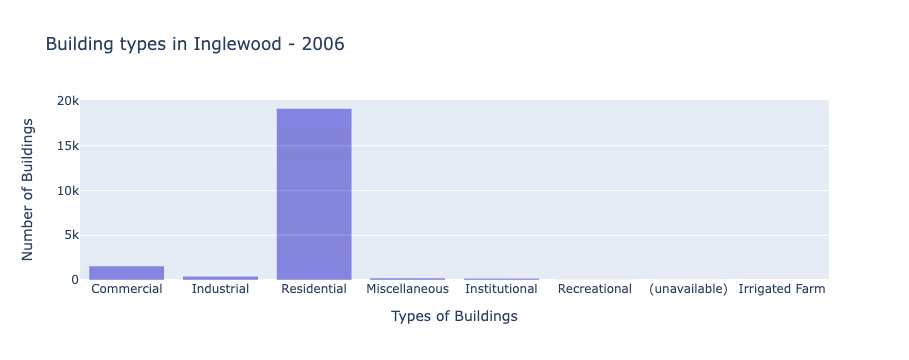

In [7]:
# add labels by providing a dict
fig = px.bar(
        df,
        x='usecodedescchar1',
        title='Building types in Inglewood - 2006',
        labels={
            'usecodedescchar1':'Types of Buildings',
            'count':'Number of Buildings'
        }
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

In [8]:
client = Socrata("data.lacounty.gov", None)

results = client.get("9trm-uz8i",
                    limit=50000,
                    where="taxratearea_city='INGLEWOOD' AND rollyear=2020")

df = pd.DataFrame.from_records(results)

df.sample(2)

,taxratearea_city,ain,rollyear,taxratearea,assessorid,usetype,usecode,usecodedescchar1,usecodedescchar2,totbuildingdatalines,yearbuilt,effectiveyearbuilt,sqftmain,bedrooms,bathrooms,units,recordingdate,roll_landvalue,roll_landbaseyear,roll_impvalue,roll_impbaseyear,roll_totlandimp,roll_homeownersexemp,roll_realestateexemp,roll_fixturevalue,roll_fixtureexemp,roll_perspropvalue,roll_perspropexemp,istaxableparcel,roll_totalvalue,roll_totalexemption,nettaxablevalue,parcelclassification,adminregion,cluster,parcelboundarydescription,situshouseno,rowid,center_lat,center_lon,location_1,usecodedescchar4,situszip,propertylocation,usecodedescchar3,situsdirection,situsstreet,situscity,situszip5,situsunit,situsfraction
17908,INGLEWOOD,4025019035,2020,04596,4025-019-035,CND,010C,Residential,Single Family Residence,1,1986,1986,1041,2,2,1,20140924,145857,2004,127140,2004,272997,0,0,0,0,0,0,Y,272997,0,272997,NaN,09,09495,TR=39164 LOT 19 CONDOMINIUM*UNIT 119,8718,20204025019035,33.958224739999999,-118.33881639000001,"{'latitude': '33.95822474', 'longitude': '-118...",Condominium,90305-3513,"8718 WEYBRIDGE PL, D INGLEWOOD CA 90305",NaN,NaN,WEYBRIDGE PL,INGLEWOOD CA,90305,D,NaN
7615,INGLEWOOD,4021002004,2020,04569,4021-002-004,R-I,0500,Residential,Five or More Units or Apartments (Any Combinat...,1,1957,1957,3870,6,6,6,20161123,1061208,2017,407503,2017,1468711,0,0,0,0,528,0,Y,1469239,0,1469239,NaN,09,09412,TRACT # 146 LOT 4 BLK 2,612,20204021002004,33.963311879999999,-118.34636981,"{'latitude': '33.96331188', 'longitude': '-118...",NaN,90301-1940,612 AERICK ST INGLEWOOD CA 90301,4 Stories or Less,NaN,AERICK ST,INGLEWOOD CA,90301,NaN,NaN


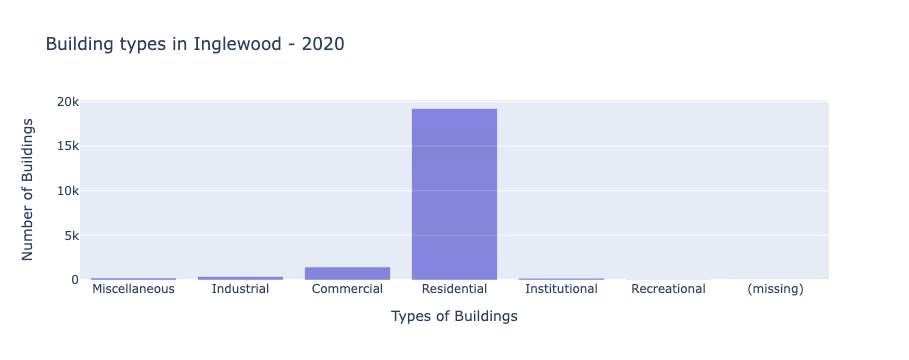

In [23]:
# add labels by providing a dict
fig = px.bar(
        df,
        x='usecodedescchar1',
        title='Building types in Inglewood - 2020',
        labels={
            'usecodedescchar1':'Types of Buildings',
            'count':'Number of Buildings'
        }
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

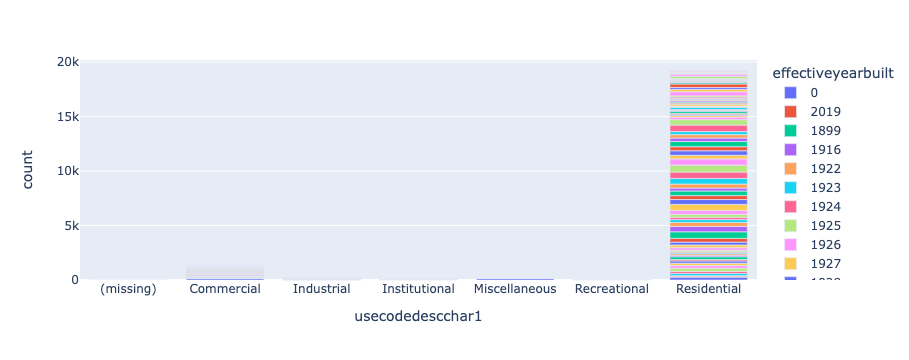

In [14]:
# make a stacked bar chart
fig = px.bar(df_flat,
       x='usecodedescchar1',
       y='count',
       color='effectiveyearbuilt' # this creates the "stack"
)

fig.show()

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21240 entries, 0 to 21239
Data columns (total 51 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   taxratearea_city           21240 non-null  object
 1   ain                        21240 non-null  object
 2   rollyear                   21240 non-null  object
 3   taxratearea                21240 non-null  object
 4   assessorid                 21240 non-null  object
 5   usetype                    21235 non-null  object
 6   usecode                    21236 non-null  object
 7   usecodedescchar1           21240 non-null  object
 8   usecodedescchar2           21240 non-null  object
 9   totbuildingdatalines       21240 non-null  object
 10  yearbuilt                  21240 non-null  object
 11  effectiveyearbuilt         21240 non-null  object
 12  sqftmain                   21240 non-null  object
 13  bedrooms                   21240 non-null  object
 14  bathro

In [16]:
df_mini = df[['ain','usecodedescchar1','effectiveyearbuilt','roll_impvalue','center_lat','center_lon',]]

In [17]:
df_mini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21240 entries, 0 to 21239
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   ain                 21240 non-null  object
 1   usecodedescchar1    21240 non-null  object
 2   effectiveyearbuilt  21240 non-null  object
 3   roll_impvalue       21240 non-null  object
 4   center_lat          21237 non-null  object
 5   center_lon          21237 non-null  object
dtypes: object(6)
memory usage: 995.8+ KB


In [18]:
df_mini['center_lat'] = df_mini['center_lat'].astype(float)
df_mini['center_lon'] = df_mini['center_lon'].astype(float)
df_mini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21240 entries, 0 to 21239
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ain                 21240 non-null  object 
 1   usecodedescchar1    21240 non-null  object 
 2   effectiveyearbuilt  21240 non-null  object 
 3   roll_impvalue       21240 non-null  object 
 4   center_lat          21237 non-null  float64
 5   center_lon          21237 non-null  float64
dtypes: float64(2), object(4)
memory usage: 995.8+ KB


/tmp/ipykernel_53/1363317119.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_53/1363317119.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



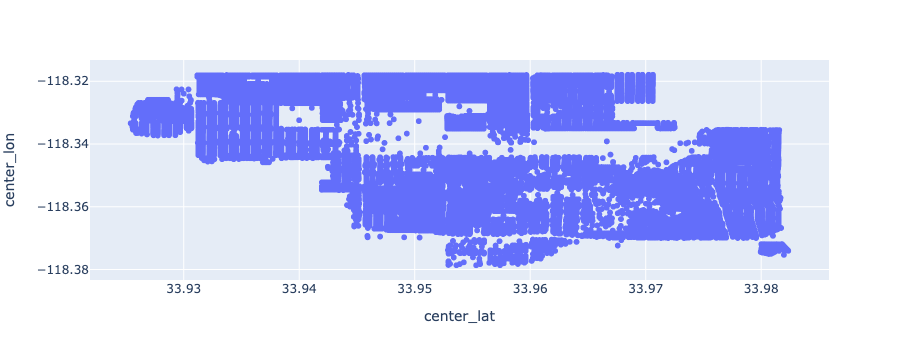

In [19]:
fig = px.scatter(df_mini,
           x='center_lat',
           y='center_lon'
)

fig.show()

In [20]:
building_type_list = df_mini.usecodedescchar1.unique().tolist()
building_type_list

['Miscellaneous',
 'Industrial',
 'Commercial',
 'Residential',
 'Institutional',
 'Recreational',
 '(missing)']

In [21]:
def building_map(building='Residential'):
    
    fig = px.scatter_mapbox(
                            df_mini[df_mini.usecodedescchar1==building], 
                            lat="center_lat", 
                            lon="center_lon", 
                            color="usecodedescchar1",
                            labels={'usecodedescchar1':'Building Type'}
                           )

    fig.update_layout(mapbox_style="carto-darkmatter")

    fig.show()


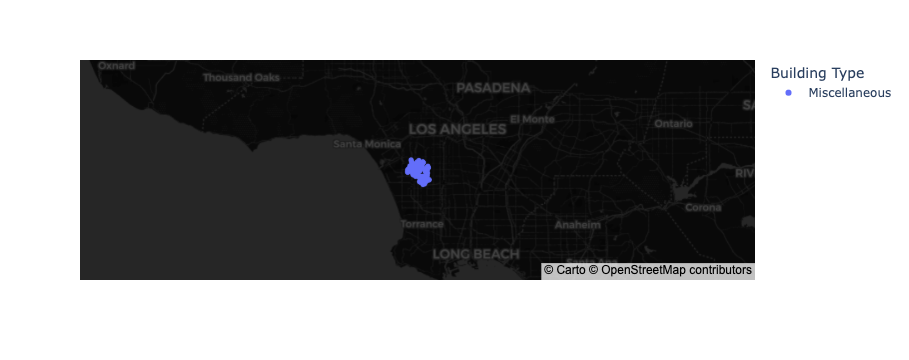

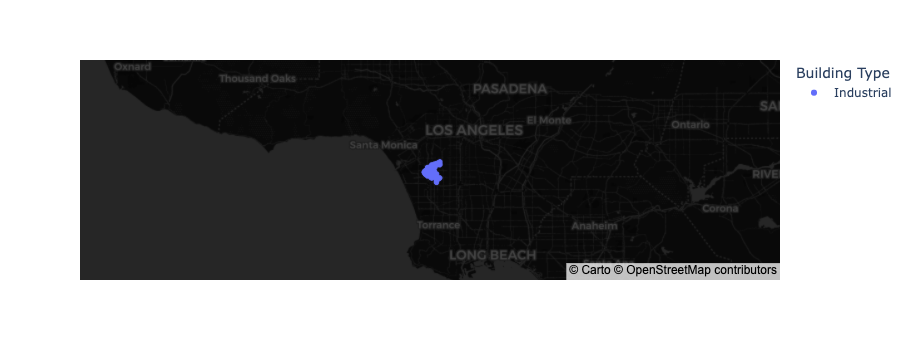

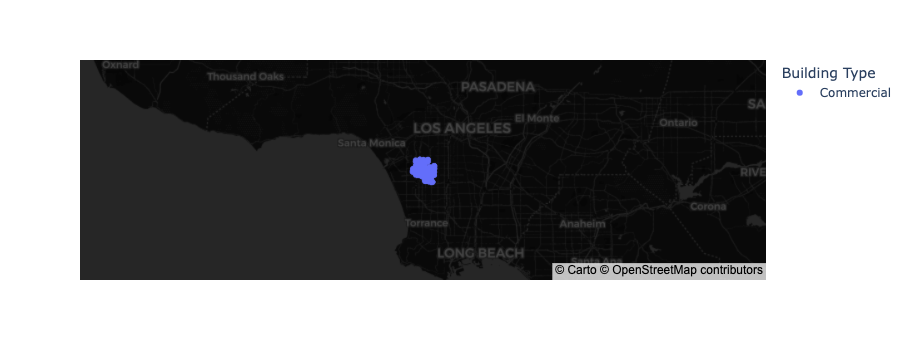

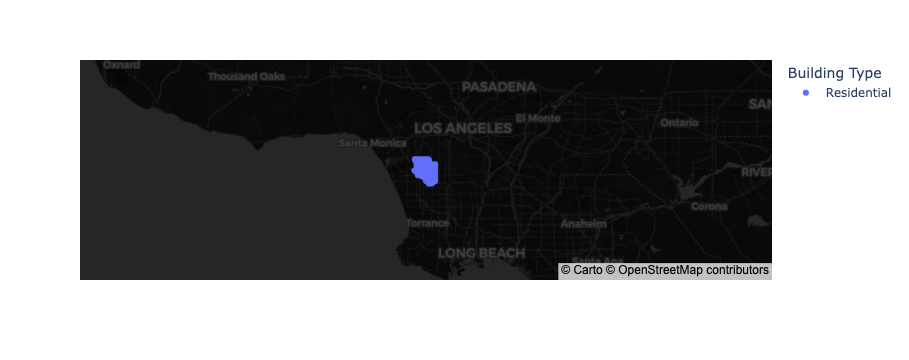

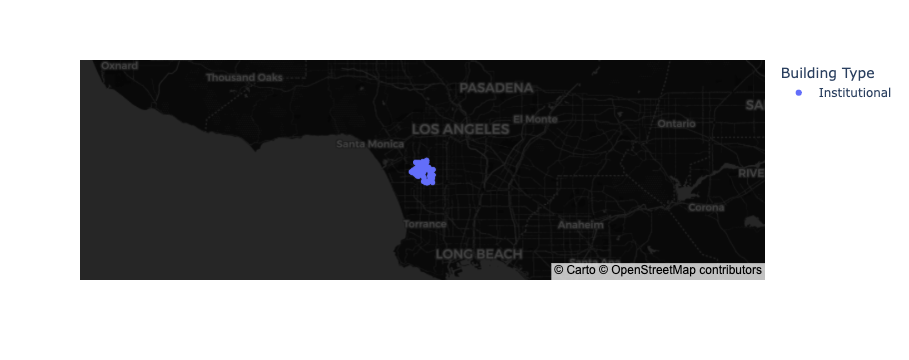

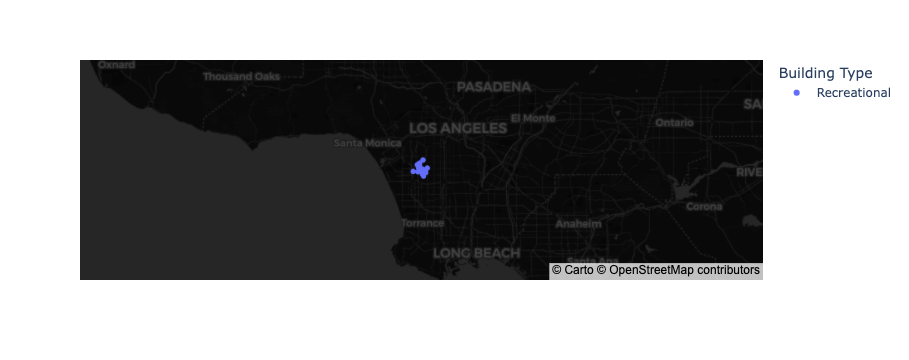

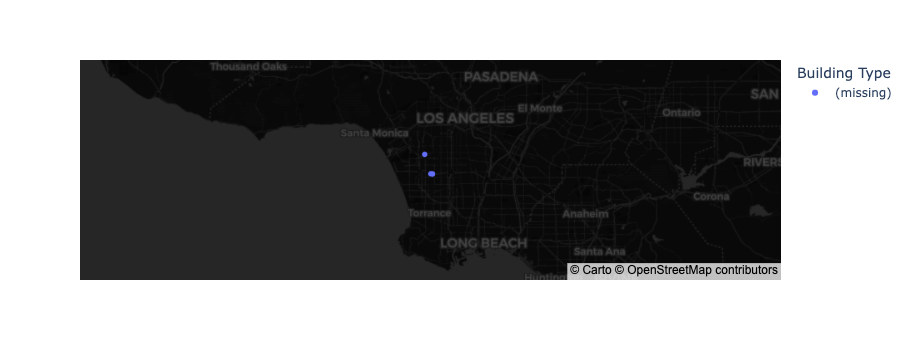

In [22]:
for building in building_type_list:
    building_map(building)

#### Conclusion
We see little to no changes in the physical environment of Inglewood. The areas that have minimal changes are mainly comemrical properties near the Stadium. This part of our analysis propels us to the next two sections of our analysis: Effective Year and Assesses Total Value.